In [1]:
import torch
import torchvision
from tqdm import tqdm
import numpy as np
from unet import UNet
from torch.utils.data import DataLoader
import os
import sys
from train import evaluate
import matplotlib.pyplot as plt

SCRIPT_DIR = os.path.dirname(os.path.abspath("__file__"))
sys.path.append(os.path.dirname(SCRIPT_DIR))

from dataset import PanDataset
from utils import evaluate_model_all_metrics, evaluate_pansharpening

In [2]:
def get_benchmark(pan_img, rgb_img):
    return rgb_img

# Pleiades results

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.empty_cache()

train_perc = 0.8
batch_size = 4
num_workers = 4

model_path = "../../models/unet/unet_pleiades_best.pth"
# model_path = "../../models/unet/unet_SOTA_epoch_10.pth"

path_to_data = "../../data/"
# path_to_data = path_to_data + "SOTA/"
path_to_data = path_to_data + "Tiled Pleiades images/"



path_to_val_pan = os.path.join(path_to_data, "pan")
path_to_val_rgb = os.path.join(path_to_data, "rgb")
path_to_val_sharp = os.path.join(path_to_data, "sharp")

In [4]:
unet = UNet(n_channels=4, n_classes=3).cuda()
weights = torch.load(model_path)
unet.load_state_dict(weights)

val_data = PanDataset(path_to_pan=path_to_val_pan, path_to_rgb=path_to_val_rgb, path_to_sharp=path_to_val_sharp, train_perc=1 - train_perc, train=True)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)

criterion = torch.nn.MSELoss()

val_loss = evaluate(net=unet, val_loader=val_loader, criterion=criterion)
print(f'validation loss: {val_loss}')

validation loss: 0.0018142696360143873


1.0
1.0244317
1.0
1.0236118
1.0
1.076956
1.0
1.0857183


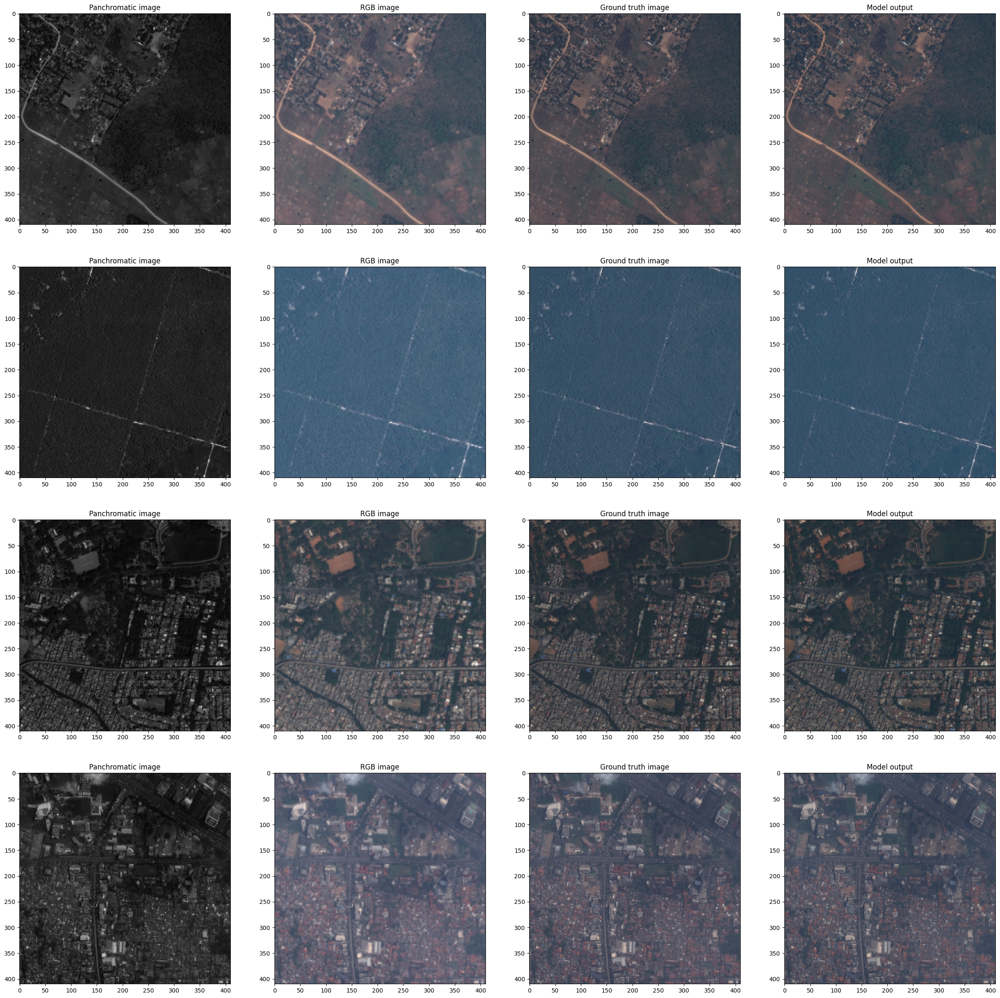

In [5]:
plt.figure(figsize=(30, 30))

with torch.no_grad():
    for x, y in val_loader:
        x, y = x.to(device), y.to(device)
        outputs = unet(x)
        x, y, outputs = x.to("cpu").numpy(), y.to("cpu").numpy(), outputs.to("cpu").numpy()
        
        i = 0
        for input_imgs, sharp, output in zip(x, y, outputs):
            
            input_imgs = input_imgs.transpose((1, 2, 0))
            sharp = sharp.transpose((1, 2, 0))
            output = output.transpose((1, 2, 0))

            pan = input_imgs[:, :, 0]
            rgb = input_imgs[:, :, 1:]
    
            plt.subplot(batch_size, 4, i + 1)
            plt.imshow(pan / np.amax(pan), cmap="gray")
            plt.title("Panchromatic image")

            plt.subplot(batch_size, 4, i + 2)
            plt.imshow(rgb / np.amax(rgb))
            plt.title("RGB image")

            plt.subplot(batch_size, 4, i + 3)
            print(np.amax(sharp))
            plt.imshow(sharp / np.amax(sharp))
            plt.title("Ground truth image")

            plt.subplot(batch_size, 4, i + 4)
            print(np.amax(output))
            plt.imshow(output / np.amax(output))
            plt.title("Model output")

            i += 4
        
        break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0199686
1.1799043


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0917208
1.1204243


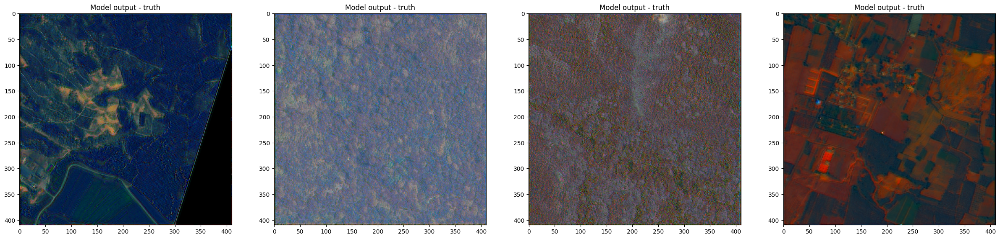

In [6]:
plt.figure(figsize=(30, 30))

with torch.no_grad():
    for x, y in val_loader:
        x, y = x.to(device), y.to(device)
        outputs = unet(x)
        x, y, outputs = x.to("cpu").numpy(), y.to("cpu").numpy(), outputs.to("cpu").numpy()
        
        i = 0
        for input_imgs, sharp, output in zip(x, y, outputs):
            
            input_imgs = input_imgs.transpose((1, 2, 0))
            sharp = sharp.transpose((1, 2, 0))
            output = output.transpose((1, 2, 0))

            pan = input_imgs[:, :, 0]
            rgb = input_imgs[:, :, 1:]

            plt.subplot(1, 4, i + 1)
            print(np.amax(output))
            plt.imshow((output - sharp) / np.amax(output - sharp))
            plt.title("Model output - truth")

            i += 1
        
        break

In [7]:
print(evaluate_model_all_metrics(net=unet, data_loader=val_loader))

Pearson        0.992611
SSIM           0.890048
MSE        30459.777728
dtype: float64


In [8]:
print(evaluate_pansharpening(path_to_val_sharp, algorithm=get_benchmark, train=False, train_perc=train_perc))

100%|██████████| 1022/1022 [01:21<00:00, 12.59it/s]

Pearson       0.911996
SSIM          0.678591
MSE        2024.409165
dtype: float64


# SOTA results

In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.cuda.empty_cache()

train_perc = 0.8
batch_size = 4
num_workers = 4

model_path = "../../models/unet/unet_SOTA_epoch_35.pth"

path_to_data = "../../data/"
path_to_data = path_to_data + "SOTA/"


path_to_val_pan = os.path.join(path_to_data, "pan")
path_to_val_rgb = os.path.join(path_to_data, "rgb")
path_to_val_sharp = os.path.join(path_to_data, "sharp")

In [10]:
unet = UNet(n_channels=4, n_classes=3).cuda()
weights = torch.load(model_path)
unet.load_state_dict(weights)

val_data = PanDataset(path_to_pan=path_to_val_pan, path_to_rgb=path_to_val_rgb, path_to_sharp=path_to_val_sharp, train_perc=1 - train_perc, train=True, downsample_rgb=5)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)

criterion = torch.nn.MSELoss()

val_loss = evaluate(net=unet, val_loader=val_loader, criterion=criterion)
print(f'validation loss: {val_loss}')

validation loss: 4.957857668118736e-05


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1.0
1.0035483
1.0
0.99957365
1.0
1.0025724
1.0
1.0077657


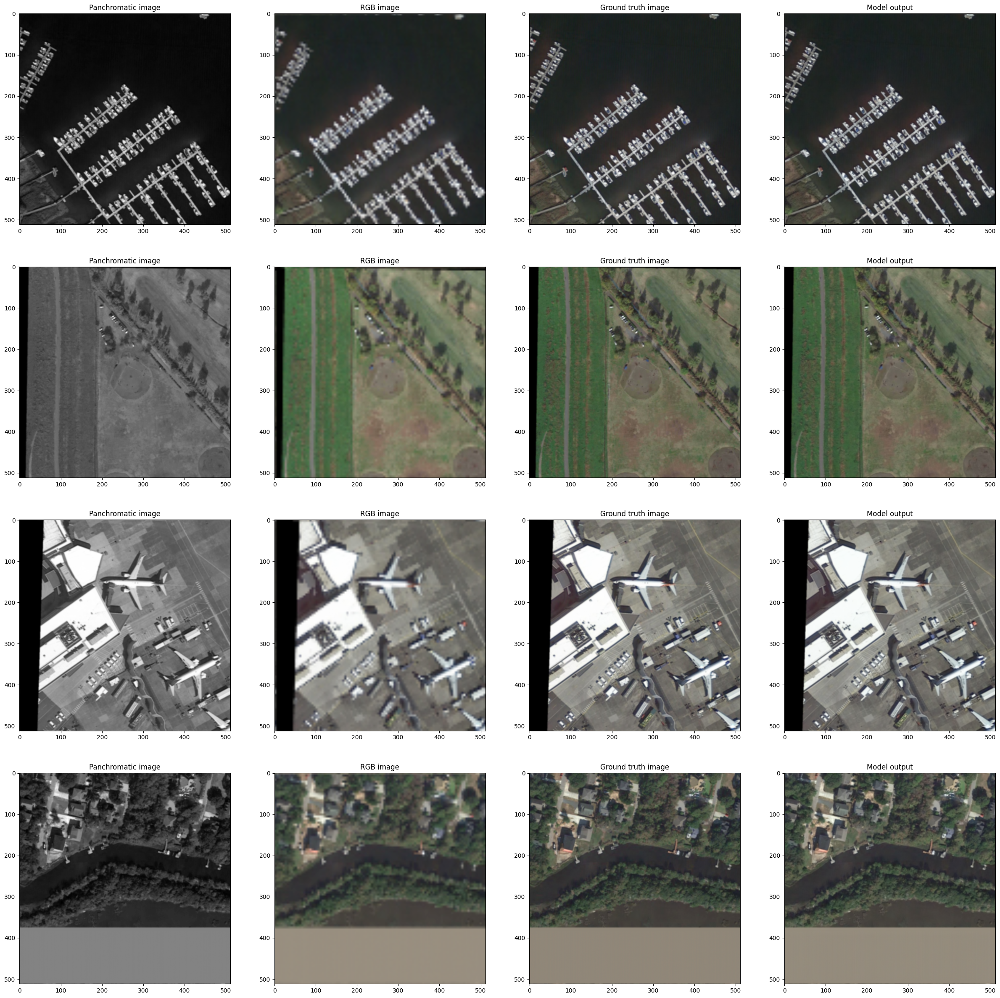

In [11]:
plt.figure(figsize=(30, 30))

with torch.no_grad():
    for x, y in val_loader:
        x, y = x.to(device), y.to(device)
        outputs = unet(x)
        x, y, outputs = x.to("cpu").numpy(), y.to("cpu").numpy(), outputs.to("cpu").numpy()
        
        i = 0
        for input_imgs, sharp, output in zip(x, y, outputs):
            
            input_imgs = input_imgs.transpose((1, 2, 0))
            sharp = sharp.transpose((1, 2, 0))
            output = output.transpose((1, 2, 0))

            pan = input_imgs[:, :, 0]
            rgb = input_imgs[:, :, 1:]
    
            plt.subplot(batch_size, 4, i + 1)
            plt.imshow(pan / np.amax(pan), cmap="gray")
            plt.title("Panchromatic image")

            plt.subplot(batch_size, 4, i + 2)
            plt.imshow(rgb / np.amax(rgb))
            plt.title("RGB image")

            plt.subplot(batch_size, 4, i + 3)
            print(np.amax(sharp))
            plt.imshow(sharp / np.amax(sharp))
            plt.title("Ground truth image")

            plt.subplot(batch_size, 4, i + 4)
            print(np.amax(output))
            plt.imshow(output / np.amax(output))
            plt.title("Model output")

            i += 4
        
        break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.99909663
1.0164847
0.99055856
0.99773014


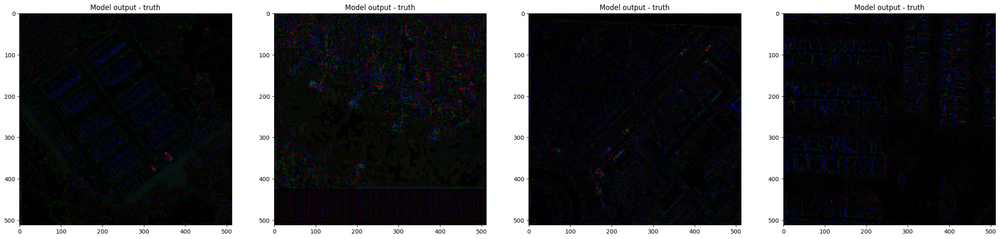

In [12]:
plt.figure(figsize=(30, 30))

with torch.no_grad():
    for x, y in val_loader:
        x, y = x.to(device), y.to(device)
        outputs = unet(x)
        x, y, outputs = x.to("cpu").numpy(), y.to("cpu").numpy(), outputs.to("cpu").numpy()
        
        i = 0
        for input_imgs, sharp, output in zip(x, y, outputs):
            
            input_imgs = input_imgs.transpose((1, 2, 0))
            sharp = sharp.transpose((1, 2, 0))
            output = output.transpose((1, 2, 0))

            pan = input_imgs[:, :, 0]
            rgb = input_imgs[:, :, 1:]

            plt.subplot(1, 4, i + 1)
            print(np.amax(output))
            plt.imshow((output - sharp) / np.amax(output - sharp))
            plt.title("Model output - truth")

            i += 1
        
        break

In [13]:
print(evaluate_model_all_metrics(net=unet, data_loader=val_loader, sota=True))

Pearson    0.999082
SSIM       0.908757
MSE        3.224892
dtype: float64


In [14]:
print(evaluate_pansharpening(path_to_val_sharp, algorithm=get_benchmark, train=False, train_perc=train_perc))

100%|██████████| 2663/2663 [07:42<00:00,  5.76it/s]


Pearson     0.988327
SSIM        0.877097
MSE        25.241021
dtype: float64
